# Домашнее задание №5.
## Машина опорных векторов (SVM)

---
**Выполнила:** Халфина Айсылу Зуфаровна

**Группа:** НПМбд-02-19

---

## 1. Квадратичное программирование и QP-солвер

Квадратичное программирование (QP) — специальный тип задач математической оптимизации, заключающийся в нахождении точки минимума неотрицательно-определенной квадратичной формы (многомерная парабола) в присутствии линейных ограничений:
$$
\begin{gather}
    \frac{1}{2}\boldsymbol x^T\boldsymbol P\boldsymbol x + \boldsymbol q^T\boldsymbol x \to \min_{\boldsymbol x} \\
    \begin{aligned}
        \text{s.t.} \quad & \boldsymbol G\boldsymbol x \le \boldsymbol h \\
        & \boldsymbol A\boldsymbol x = \boldsymbol b
    \end{aligned}
\end{gather}
$$

Здесь $\boldsymbol P$ — симметричная матрица. В ограничениях $\boldsymbol G\boldsymbol x \le \boldsymbol h$ и $\boldsymbol A\boldsymbol x = \boldsymbol b$ под знаками равенства и неравенства подразумевается сравнение всех компонент векторов.

Задача квадратичного программирования хорошо изучена, существуют эффективные алгоритмы для ее решения. Имеется множество библиотек с солверами для задачи QP, вот некоторые из них:
 - [CVXOPT](http://cvxopt.org/) (свободно-распространяемая, Python) **рекомендуется к использованию**
 - [Mosek](https://www.mosek.com/) (коммерческая с возможностью получения академической лицензии, C, Java, MATLAB, .NET, R, Python)
 - [Matlab Optimization Toolbox](http://www.mathworks.com/help/optim/ug/quadprog.html) 

#### Задание

1. Установите QP-солвер, разберитесь с его интерфейсом.
2. Протестируйте солвер, решив простую задачу оптимизации в двумерном пространстве:
$$f(\boldsymbol x) = -8x_1 - 16x_2 + x_1^2 + 4x_2^2, \quad \text{s.t.:} \; x_1 + x_2 \leq 5, \; 0 \leq x_1 \leq 3, \; x_2 \geq 0$$
3. Какие из ограничений-неравенств задачи являются _активными_, т.е. влияют на точку оптимума, а какие ограничения можно выбросить и точка оптимума не поменяется?

In [1]:
import numpy as np
from cvxopt import matrix
from cvxopt import solvers
from sklearn.datasets import make_classification
import matplotlib.pyplot as plt
from sklearn.base import BaseEstimator

solvers.options['show_progress'] = False

In [2]:
P = matrix(np.diag([2, 8]), tc = 'd')
q = matrix(np.array([-8, -16]), tc = 'd')

G = matrix(np.array([[1, 1], [1, 0], [-1, 0], [0, -1]]), tc = 'd')
h = matrix(np.array([5, 3, 0, 0]), tc = 'd')
solve1 = solvers.qp(P,q,G,h)

G = matrix(np.array([[1., 0.], [-1., 0.], [0., -1.]]),  tc='d')
h = matrix(np.array([3., 0., 0.]),  tc='d')
solve2 = solvers.qp(P, q, G, h)

G = matrix(np.array([[1., 1.], [-1., 0.], [0., -1.]]),  tc='d')
h = matrix(np.array([5., 0., 0.]),  tc='d')
solve3 = solvers.qp(P, q, G, h)

G = matrix(np.array([[1., 1.], [1., 0.], [0., -1.]]),  tc='d')
h = matrix(np.array([5., 3., 0.]),  tc='d')
solve4 = solvers.qp(P, q, G, h)

G = matrix(np.array([[1., 1.], [1., 0.], [-1., 0.]]),  tc='d')
h = matrix(np.array([5., 3., 0.]),  tc='d')
solve5 = solvers.qp(P, q, G, h);

In [3]:
print(solve1['x'])
print('Решение без условия x1 + x2 <= 5\n', solve2['x'])
print('Решение без условия x1 <= 3\n', solve3['x'])
print('Решение без условия 0 <= x1\n', solve4['x'])
print('Решение без условия x2 >= 0\n', solve5['x'])

[ 3.00e+00]
[ 2.00e+00]

Решение без условия x1 + x2 <= 5
 [ 3.00e+00]
[ 2.00e+00]

Решение без условия x1 <= 3
 [ 3.20e+00]
[ 1.80e+00]

Решение без условия 0 <= x1
 [ 3.00e+00]
[ 2.00e+00]

Решение без условия x2 >= 0
 [ 3.00e+00]
[ 2.00e+00]



**Вывод**: активным ограничением является $x_1 \leq 3$. Остальные ограничения можно отбросить.

## 2. Линейный SVM

Рассмотрим задачу бинарной классификации. Будем обозначать обучающую выборку $\{(\boldsymbol x_n, y_n)\}_{n=1}^N$, где $N$ — количество объектов, $\boldsymbol x_n \in \mathbb{R}^d$ — числовой вектор признакового описания объекта, $y_n \in \{+1, -1\}$ — класс объекта.

Машина опорных векторов обучает модель разделяющей гиперплоскости:
$$f(\boldsymbol x) = \boldsymbol w^T \boldsymbol x + b$$
Параметры модели — вектор весов $\boldsymbol w \in \mathbb{R}^d$ и сдвиг $b \in \mathbb{R}$.

Обучение модели происходит путем решения оптимизационной задачи:
$$
\begin{gather}
    \frac{1}{2} \| \boldsymbol w \|^2 + C \sum_{n=1}^N \xi_n \to \min_{\boldsymbol w, \boldsymbol \xi, b} \\
    \text{s.t.: } \quad y_n (\boldsymbol w^T \boldsymbol x_n + b) \geq 1 - \xi_n, \quad \xi_n \geq 0, \quad \forall n=1,\dots,N
\end{gather}
$$

Ограничения вида $\quad y_n (\boldsymbol w^T \boldsymbol x_n + b) \geq 1$ требуют, чтобы объекты правильно классифицировались разделяющей гиперплоскостью. Поскольку линейная разделимость выборки не гарантируется на практике, вводят переменные $\xi_n$ (slack variables), которые ослабляют ограничения правильной классификации. В оптимизируемом функционале слагаемое $\| \boldsymbol w \|^2$ штрафует малую ширину разделяющей гиперплоскости, сумма $\sum_n \xi_n$ штрафует ослабление ограничений. 

Гиперпараметр $C$ задает баланс между шириной разделяющей полосы и ошибками, допускаемыми классификатором. Обратите внимание, что $C$ фиксируется до обучения и не оптимизируется вместе с параметрами модели.

Гиперпараметр $C$ отвечает за обобщающую способность разделяющей гиперплоскости, высокая обобщающая способность (соотвествующая большому значению $C$) может привести к переобучению, если линейная модель хорошо описывает обучающие примеры. При подборе оптимального параметра $C$ необходимо оценивать качество на отложенной выборке или кросс-валидации. Как правило, для конкретной задачи заранее неизвестно, какой порядок имеет оптимальное значение гиперпараметра $C$, поэтому перебирать значения лучше по логарифмической сетке, например: $10^{-3}, 10^{-2}, \dots, 10^{5}$.

После нахождения решения оптимизационной задачи $(\boldsymbol w_{\star}, \boldsymbol \xi_{\star}, b_{\star})$, часть ограничений становятся _активными_, т.е. переходят в "крайнее положение" — точное равенство:
$$\quad y_n (\boldsymbol w_{\star}^T \boldsymbol x_n + b_{\star}) = 1 - \xi_{\star,n}$$
Объекты, соответствующие активным ограничениям называются _опорными_.

#### Явное преобразование признаков

Разделяющая гиперплоскость — достаточно грубая модель, редко данные могут быть описаны линейной моделью. Линейная неразделимость векторов может быть исправлена путем перехода в другое признаковое пространство, в котором линейная модель лучше описывает данные и, возможно, существует правильно классифицирующая разделяющая гиперплоскость:

$$\boldsymbol x \in \mathbb{R}^d \mapsto \phi(\boldsymbol x) \in \mathbb{R}^t$$

Так, например, добавление всех попарных произведений признаков: $\phi(x_1, \dots, x_d) = (x_1, \dots, x_d, x_1^2, x_1x_2, \dots, x_d^2)$ переводит в пространство, в котором линейная гиперплоскость является квадратичной формой в исходном пространстве и в исходном пространстве признаков разделяющая поверхность может быть, скажем, эллипсом.

[Видеоролик с демонстрацией](https://youtu.be/9NrALgHFwTo)

#### Задание
  1. Сведите задачу обучения линейного SVM к QP, реализуйте процедуру обучения Линейного SVM при помощи QP-солвера.
  2. Сгенерируйте три случайные двумерные выборки для бинарной классификации:
    - с линейно-разделимыми классами
    - с хорошо разделимыми классами, но не линейно
    - с плохо разделимыми классами по имеющимся признакам
  3. Протестируйте линейный SVM на сгенерированных выборках. Покажите на плоскости разделяющую прямую и линии уровня, ограничивающие коридор $f(\boldsymbol x) = \pm 1$. Выделите опорные вектора точками другой формы или большего размера. Постройте классификаторы с различным значением параметра $C$.
  4. Как зависит число опорных векторов от параметра $C$ для различных выборок?
  5. Используя явное преобразование признаков обучите методом опорных векторов квадратичную разделяющую поверхность. Покажите ее на плоскости.

In [11]:
class LinearSVM(BaseEstimator):
    def __init__(self, C=1):
        self.C = C
        self.N = None
        self.d = None
        self.w = None
        self.b = None
        self.vect = None
        self.vect_c = None
        
    def fit(self, X, y):
        self.N, self.d = X.shape
        
        P = np.vstack((np.hstack((np.eye(self.d), np.zeros((self.d, self.N+1)))), np.zeros((self.N+1, self.N+1+self.d))))
        q = np.hstack(([0]*(self.d+1), [self.C]*self.N))
        
        G_v = np.hstack((-y.reshape(self.N, 1) * X, -y.reshape(self.N, 1), -np.eye(self.N)))
        G_n = np.hstack((np.zeros((self.N, self.d + 1)), -np.eye(self.N)))
        G = np.vstack((G_v, G_n))
        
        h = np.hstack(([-1.]*self.N, [0.]*self.N)) 
        
        P = matrix(P, tc='d')
        q = matrix(q, tc='d')
        G = matrix(G, tc='d')
        h = matrix(h, tc='d')
        
        sol = solvers.qp(P, q, G, h, kktsolver='ldl', options={'kktreg':1e-9, 'show_progress':False})
        self.w = np.array(sol['x'][:self.d])
        self.b = float(np.array(sol['x'][self.d:self.d+1]))
        self.ksi = np.array(sol['x'][self.d+1:])
    
        self.supp_vect_m = np.zeros(self.N)
        for i in range(self.N):
            if np.round(y[i] * (self.w.T.dot(X[i, :]) + self.b), 5) == np.round(1 - self.ksi[i], 5):
                self.supp_vect_m[i] = 1
        m = (self.supp_vect_m == 1)
        self.supp_vect = X[m]
        self.supp_vect_c = y[m]
        
    def predict_proba(self, X):
        return (np.dot(X, self.w) + self.b).flatten()
            
    def predict(self, X):
        return np.sign(self.predict_proba(X))
    
def visualize_linear_svm(X, y, C, i, j):
    
    model = LinearSVM(C)
    model.fit(X, y)
    X_supp = model.supp_vect
    y_supp = model.supp_vect_c
    w = model.w
    b = model.b
    
    ax[i][j].scatter(X[:, 0], X[:, 1], c=y, cmap='cool', edgecolor='black')
    x_lim = np.array(ax[i][j].get_ylim())
    ax[i][j].set_ylim(x_lim[0], x_lim[1])
    ax[i][j].scatter(X_supp[:, 0], X_supp[:, 1], s=150, c = y_supp, cmap='spring', edgecolor='black')
    
    x0_vals = np.linspace(ax[i][j].get_xlim()[0], ax[i][j].get_xlim()[1], 200)
    x1_vals = np.linspace(ax[i][j].get_ylim()[0], ax[i][j].get_ylim()[1], 200)
    xx, yy = np.meshgrid(x0_vals, x1_vals)
    zz = np.reshape(model.predict_proba(np.c_[xx.ravel(), yy.ravel()]), xx.shape)
   
    ax[i][j].contour(xx, yy, zz, levels=[-1, 0, 1], colors='k', linestyles = ['dashed', 'solid', 'dashed'], linewidths=1.5, zorder=1)
    ax[i][j].pcolormesh(xx, yy, zz, cmap='plasma', zorder=0, shading='nearest')

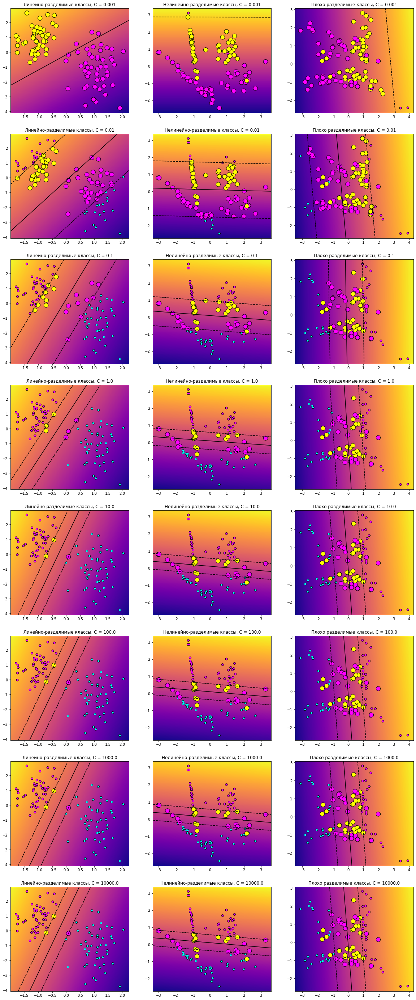

In [12]:
C = 10. ** np.arange(-3, 5)
fig, ax = plt.subplots(len(C), 3, figsize=(20,50))

state = [8, 13, 57]
classs = [1, 2, 2]
name = ['Линейно-разделимые классы', 'Нелинейно-разделимые классы', 'Плохо разделимые классы' ]
for j in range(3):
    X, y = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=classs[j], random_state=state[j])
    y[y == 0] = -1
    for i in range(len(C)):
        visualize_linear_svm(X, y, C[i], i, j)
        ax[i][j].set_title(name[j] + ', C = ' + str(C[i]))

**Вывод:** Чем больше параметр C, тем меньше опорных векторов.

Теперь используя явное преобразование признаков.

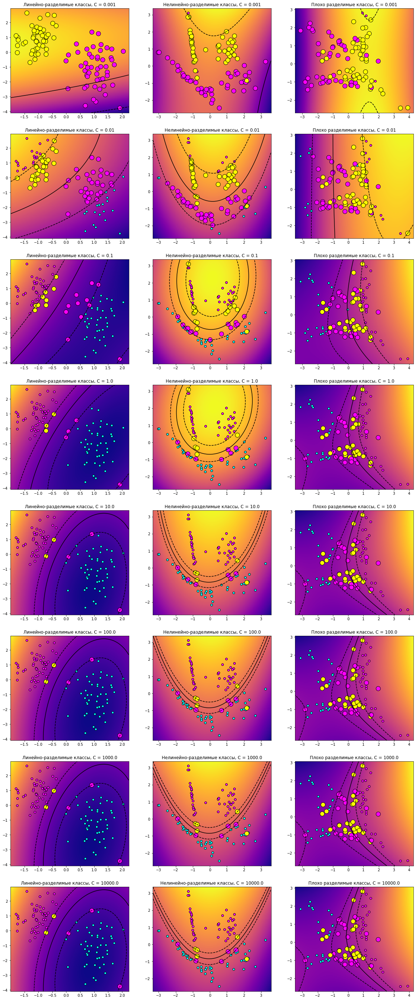

In [13]:
def transformation(X):
    X_transf = np.zeros((X.shape[0], 5))
    X_transf[:, 0] = X[:, 0]
    X_transf[:, 1] = X[:, 1]
    X_transf[:, 2] = X[:, 0] * X[:, 0]
    X_transf[:, 3] = X[:, 0] * X[:, 1]
    X_transf[:, 4] = X[:, 1] * X[:, 1]
    return X_transf

def visualize_linear_svm_tr(X, y, C, i, j):
    
    model = LinearSVM(C)
    model.fit(transformation(X), y)
    X_supp = model.supp_vect
    y_supp = model.supp_vect_c
    w = model.w
    b = model.b

    ax[i][j].scatter(X[:, 0], X[:, 1], c=y, cmap='cool', edgecolor='black')
    x_lim = np.array(ax[i][j].get_ylim())
    ax[i][j].set_ylim(x_lim[0], x_lim[1])
    ax[i][j].scatter(X_supp[:, 0], X_supp[:, 1], s=150, c = y_supp, cmap='spring', edgecolor='black')
   
    x0_vals = np.linspace(ax[i][j].get_xlim()[0], ax[i][j].get_xlim()[1], 200)
    x1_vals = np.linspace(ax[i][j].get_ylim()[0], ax[i][j].get_ylim()[1], 200)
    xx, yy = np.meshgrid(x0_vals, x1_vals)
    zz = np.reshape(model.predict_proba(transformation(np.c_[xx.ravel(), yy.ravel()])), xx.shape)

    ax[i][j].contour(xx, yy, zz, levels=[-1, 0, 1], colors='k', linestyles = ['dashed', 'solid', 'dashed'], linewidths=1.5, zorder=1)
    ax[i][j].pcolormesh(xx, yy, zz, cmap='plasma', zorder=0, shading='nearest')
    
C = 10. ** np.arange(-3, 5)
fig, ax = plt.subplots(len(C), 3, figsize=(20,50))

state = [8, 13, 57]
classs = [1, 2, 2]
name = ['Линейно-разделимые классы', 'Нелинейно-разделимые классы', 'Плохо разделимые классы' ]
for j in range(3):
    X, y = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=classs[j], random_state=state[j])
    y[y == 0] = -1
    for i in range(len(C)):
        visualize_linear_svm_tr(X, y, C[i], i, j)
        ax[i][j].set_title(name[j] + ', C = ' + str(C[i]))

# 3. Двойственный переход и Ядровой SVM

Задачу обучения линейного SVM, рассмотренную в предыдущем пункте принято называть _прямой_ оптимизационной задачей для SVM. Любая задача оптимизации с ограничениями имеет [_двойственную_ задачу Лагранжа](http://goo.gl/OujTPr), в которой оптимизируются _двойственные переменные_ (множители Лагранжа), соответствующие штрафу за нарушение ограничений, максимизируется нижняя оценка функционала прямой задачи. В случае задачи квадратичного программирования, решение двойственной задачи (значение оптимизируемого функционала) совпадает с оптимумом прямой задачи.

Подробнее можно почитать в [статье](./SMAIS11_SVM.pdf).

Двойственная задача для SVM имеет вид:
$$
\begin{gather}
    \sum_{n} \alpha_n - \frac{1}{2}\sum_{n}\sum_{n'} \alpha_{n}\alpha_{n'} y_{n}y_{n'} x_{n}^Tx_{n'} \to \max_{\alpha} \\
    \begin{aligned}
        \text{s.t. } \quad  
        & 0 \le \alpha_n \le C, \quad \forall n = 1, \dots, N \\
        & \sum_{n} \alpha_n y_n = 0
    \end{aligned}
\end{gather}
$$

Оптимизируется вектор из двойственных переменных $\alpha_n$, соответствующих объектам обучающей выборки. Объект $x_n$ является опорным, если $\alpha_n > 0$.

Предсказание вычисляется по следующему правилу:
$$\hat{y}(x) = \text{sign}\left(\sum_{n}\alpha_{n}y_{n}x^Tx_{n} + b\right).$$

Для предсказания необходимо оценить значение $b$. Известно, что для любого опорного объекта, который классифицируется безошибочно верно:
$$y_n = \sum_{n'}\alpha_{n}y_{n}x_{n}^Tx_{n'} + b,$$
значит для любого такого объекта:
$$b = y_n - \sum_{n'}\alpha_{n}y_{n}x_{n}^Tx_{n'}.$$

В случае наличия ошибок классификации обучающей выборки, предлагается усреднять значение $b$ по всем опорным векторам:
$$b = \frac{1}{N_\text{SV}}\sum_{n \in \text{SV}}\left(y_n - \sum_{n'}\alpha_{n}y_{n}x_{n}^Tx_{n'}\right).$$
Интуиция здесь такова, что суммарные ошибки в положительную сторону примерно равны суммарным ошибкам в отрицательную сторону.

Другой вариант — отказаться от параметра $b$ и работать с моделью $f(x) = w^Tx$, добавив к вектору $x$ константный признак.

#### Неявное преобразование признаков
Отметим, что двойственная задача SVM содержит вектора признаков исключительно в виде скалярного произведения $x^Tx'$. Эта особенность позволяет производить неявное преобразование признакового пространства. Вместо вычисления функции $\phi(\boldsymbol x)$, которая может отображать исходные признаки в вектора очень большой размерности, будем вычислять скалярное произведение $k(\boldsymbol x, \boldsymbol x') = \phi(\boldsymbol x)^T\phi(\boldsymbol x')$ называемое _ядром_. 

#### Задание
  1. Реализуйте процедуру обучения ядрового SVM, используя QP-солвер.
  2. Протестируйте на случайных двумерных выборках ядровой SVM. Покажите на плоскости строящиеся разделяющие поверхности, линии уровня, ограничивающие коридор $f(\boldsymbol x) = \pm 1$. Выделите опорные вектора точками другой формы или большего размера. Попробуйте следующие ядровые функции:
    - линейная: $k(x, x') = x^Tx'$
    - полиномиальная: $k(x, x') = (x^Tx' + 1)^p$ с различными степенями $p = 2,3,\dots$
    - Гауссовская-RBF: $k(x, x') = \exp(-\frac{1}{2\gamma}\|x - x'\|^2)$
  3. Как ведет себя SVM с полиномиальным ядром в зависимости от параметров $C$ и степени ядра $p$?
  4. Как ведет себя SVM с RBF-ядром в зависимости от параметров $C$ и $\gamma$? Поварьируйте параметры $C$ и $\gamma$ по логарифмической сетке. Какие значения параметров ведут к переобучению, а какие — к слишком грубой модели?

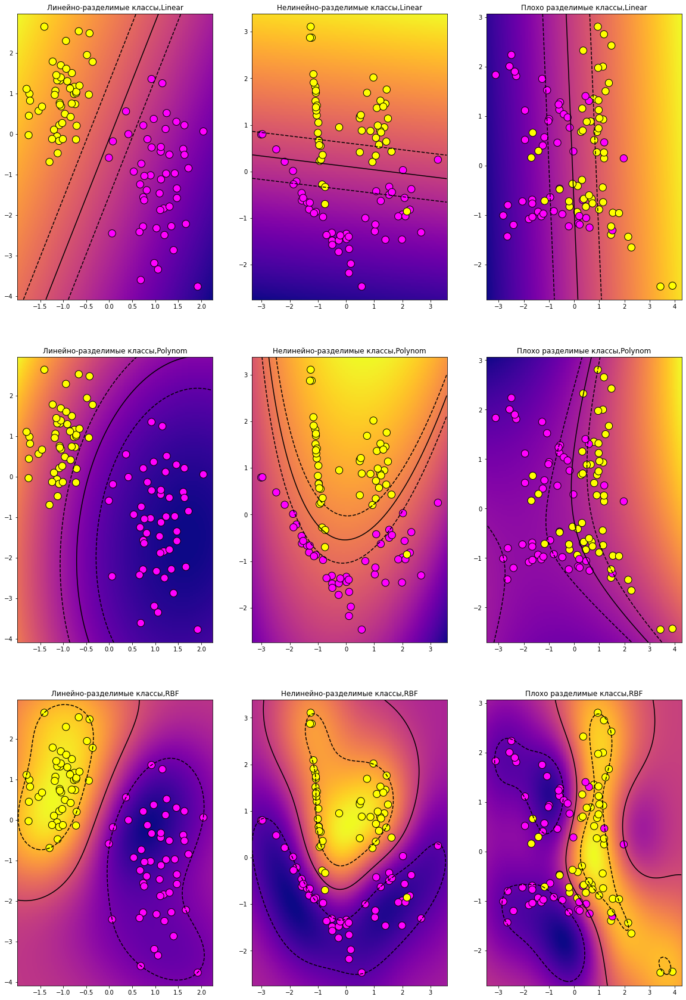

In [22]:
class DualSVM(BaseEstimator):
    def __init__(self, C, kernel=None):
        self.C = C
        self.kernel = kernel
        self.d = None
      
    def solver(self, X, y):
        self.d = X.shape[1]
        N = X.shape[0]
        
        kernel_matrix = np.zeros((N, N))
        for i in range(N):
            for j in range(N):
                kernel_matrix[i,j] = self.kernel(X[i, :], X[j, :])
        
        P = np.outer(y, y) * kernel_matrix
        P = matrix(P, tc='d')
        q = matrix(np.ones(N) * (-1), tc='d')
        
        A = matrix(y, (1, N), tc='d')
        bb = matrix(0, tc='d')

        G1 = np.eye(N)
        G2 = np.eye(N) * (-1)
        G = matrix(np.vstack((G1, G2)), tc = 'd')
        
        h1 = self.C * np.ones(N)
        h2 = np.zeros(N)
        h = matrix(np.hstack((h1, h2)), tc = 'd')

        sol = solvers.qp(P, q, G, h, A, bb, kktsolver='ldl', options={'kktreg':1e-9, 'show_progress':False})
        solv = sol['x']

        return solv
        
    def fit(self, X, y):
        solv = self.solver(X, y)
        self.alpha = np.ravel(solv)
        
        m = self.alpha != 0
        m = m.ravel()
        self.supp_vect = X[m]
        self.supp_vect_alpha = self.alpha[m]
        self.supp_vect_c = y[m]
        NN = self.supp_vect.shape[0]
        kernel_matrix = np.zeros((NN, NN))
        for i in range(NN):
            for j in range(NN):
                kernel_matrix[i, j] = self.kernel(self.supp_vect[i, :], self.supp_vect[j, :])
        self.bias = np.mean(self.supp_vect_c - np.sum(np.repeat(self.supp_vect_alpha * self.supp_vect_c, NN).reshape(NN, NN).T * kernel_matrix, axis = 1))
    
    def predict_proba(self, X):
        N = X.shape[0]
        NN = self.supp_vect.shape[0]
        kernel_matrix = np.zeros((NN, N))
        for i in range(NN):
            for j in range(N):
                kernel_matrix[i, j] = self.kernel(self.supp_vect[i, :], X[j, :])
        alph = self.supp_vect_alpha * self.supp_vect_c
        alph = np.repeat(alph, N).reshape(NN, N)
        
        return np.sum(alph * kernel_matrix, axis = 0) + self.bias 

    def predict(self, X):
        return sign(self.predict_proba(X))
    
power, gamma = 2, 1
Linear = lambda x1, x2: x1.dot(x2.T)
Polynom = lambda x1, x2: (x1.dot(x2.T) + 1) ** power
RBF = lambda x1, x2: np.exp(-1 / (2 * gamma) * np.linalg.norm(x1 - x2) ** 2)

def visualize(X, y, kernel, i, j):
    
    model = DualSVM(C = 1, kernel = kernel)
    model.fit(X, y)
    X_supp = model.supp_vect
    y_supp = model.supp_vect_c
    alpha = model.alpha
    bias = model.bias

    ax[i][j].scatter(X[:, 0], X[:, 1], c=y, cmap='cool', edgecolor='black')
    x_lim = np.array(ax[i][j].get_ylim())
    ax[i][j].set_ylim(x_lim[0], x_lim[1])
    ax[i][j].scatter(X_supp[:, 0], X_supp[:, 1], s=150, c = y_supp, cmap='spring', edgecolor='black')
    
    x0_vals = np.linspace(ax[i][j].get_xlim()[0], ax[i][j].get_xlim()[1], 200)
    x1_vals = np.linspace(ax[i][j].get_ylim()[0], ax[i][j].get_ylim()[1], 200)
    xx, yy = np.meshgrid(x0_vals, x1_vals)
    zz = np.reshape(model.predict_proba(np.c_[xx.ravel(), yy.ravel()]), xx.shape)

    ax[i][j].contour(xx, yy, zz, levels=[-1, 0, 1], colors='k', linestyles = ['dashed', 'solid', 'dashed'], linewidths=1.5, zorder=1)
    ax[i][j].pcolormesh(xx, yy, zz, cmap='plasma', zorder=0, shading='nearest')
    
kernels = [Linear, Polynom, RBF]
kernels_titles = ['Linear', 'Polynom', 'RBF']
fig, ax = plt.subplots(len(kernels), 3, figsize=(20,30))

state = [8, 13, 57]
classs = [1, 2, 2]
name = ['Линейно-разделимые классы', 'Нелинейно-разделимые классы', 'Плохо разделимые классы' ]
for j in range(3):
    X, y = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=classs[j], random_state=state[j])
    y[y == 0] = -1
    for i in range(len(kernels)):
        visualize(X, y, kernels[i], i, j)
        ax[i][j].set_title(name[j] + ',' + kernels_titles[i])

SVM с полиномиальным ядром в зависимости от параметров $C$ и степени ядра $p$

In [26]:
def visualize_polynom(X, y, kernel, i, j, C, power):
    
    Polynom = lambda x1, x2: (x1.dot(x2.T) + 1) ** power
    model = DualSVM(C = C, kernel = Polynom)
    model.fit(X, y)
    X_supp = model.supp_vect
    y_supp = model.supp_vect_c
    alpha = model.alpha
    bias = model.bias

    ax[i][j].scatter(X[:, 0], X[:, 1], c=y, cmap='cool', edgecolor='black')
    x_lim = np.array(ax[i][j].get_ylim())
    ax[i][j].set_ylim(x_lim[0], x_lim[1])
    ax[i][j].scatter(X_supp[:, 0], X_supp[:, 1], s=150, c = y_supp, cmap='spring', edgecolor='black')
    
    x0_vals = np.linspace(ax[i][j].get_xlim()[0], ax[i][j].get_xlim()[1], 200)
    x1_vals = np.linspace(ax[i][j].get_ylim()[0], ax[i][j].get_ylim()[1], 200)
    xx, yy = np.meshgrid(x0_vals, x1_vals)
    zz = np.reshape(model.predict_proba(np.c_[xx.ravel(), yy.ravel()]), xx.shape)

    ax[i][j].contour(xx, yy, zz, levels=[-1, 0, 1], colors='k', linestyles = ['dashed', 'solid', 'dashed'], linewidths=1.5, zorder=1)
    ax[i][j].pcolormesh(xx, yy, zz, cmap='plasma', zorder=0, shading='nearest')

Степень **2**

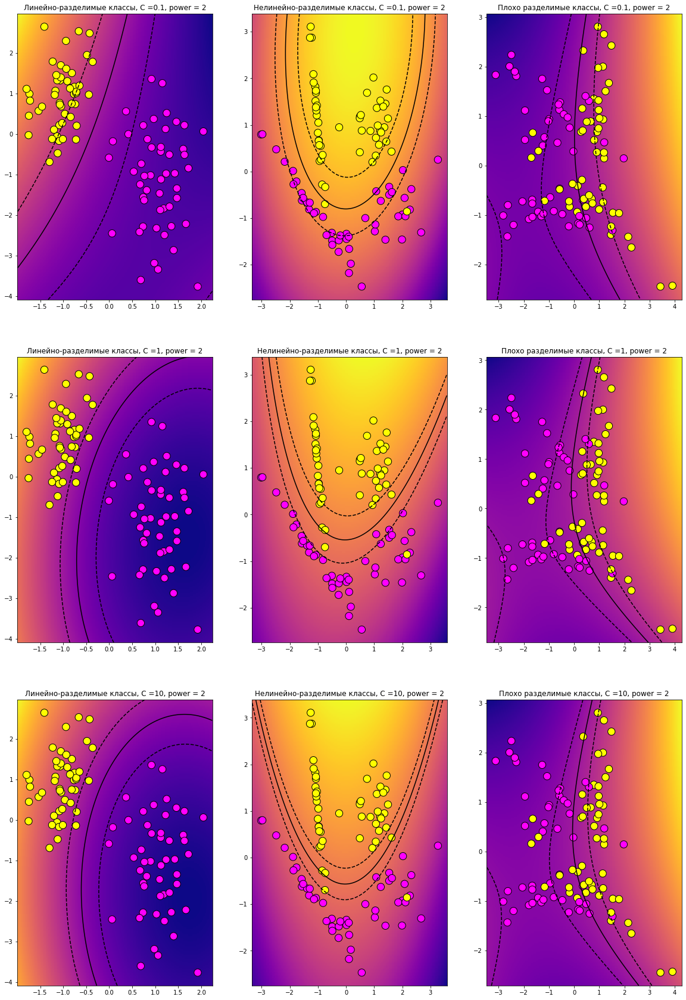

In [27]:
C = [0.1, 1, 10]
fig, ax = plt.subplots(len(C), 3, figsize=(20,30))

state = [8, 13, 57]
classs = [1, 2, 2]
name = ['Линейно-разделимые классы', 'Нелинейно-разделимые классы', 'Плохо разделимые классы' ]
for j in range(3):
    X, y = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=classs[j], random_state=state[j])
    y[y == 0] = -1
    for i in range(len(C)):
        visualize_polynom(X, y, Polynom, i, j, C[i], 2)
        ax[i][j].set_title(name[j] + ', C =' + str(C[i]) + ', power = 2')

Степень **3**

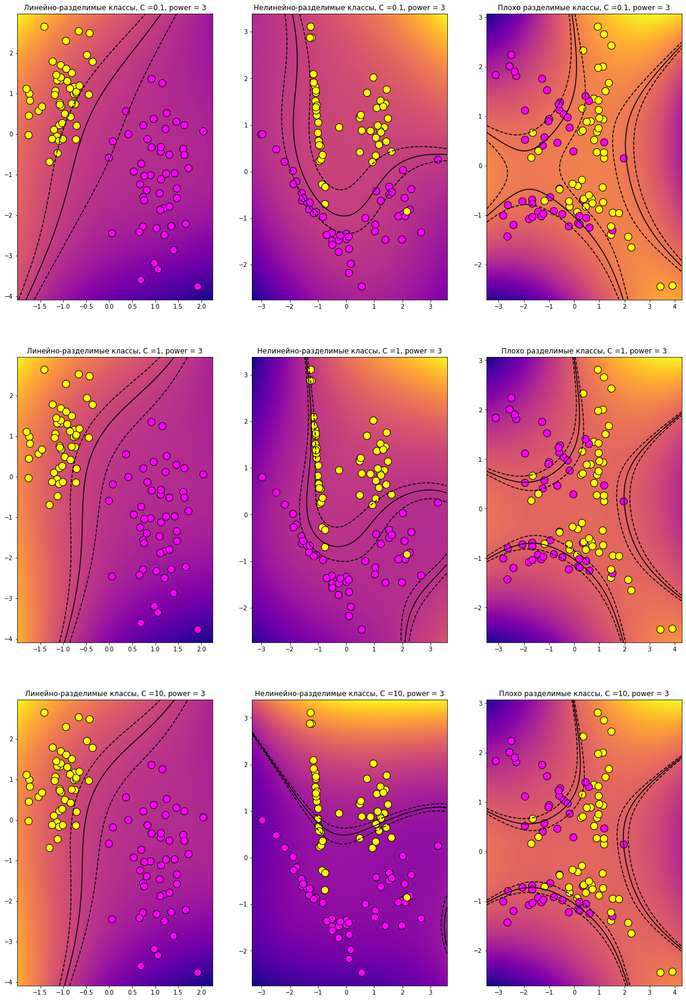

In [28]:
C = [0.1, 1, 10]
fig, ax = plt.subplots(len(C), 3, figsize=(20,30))

state = [8, 13, 57]
classs = [1, 2, 2]
name = ['Линейно-разделимые классы', 'Нелинейно-разделимые классы', 'Плохо разделимые классы' ]
for j in range(3):
    X, y = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=classs[j], random_state=state[j])
    y[y == 0] = -1
    for i in range(len(C)):
        visualize_polynom(X, y, Polynom, i, j, C[i], 3)
        ax[i][j].set_title(name[j] + ', C =' + str(C[i]) + ', power = 3')

Степень **5**

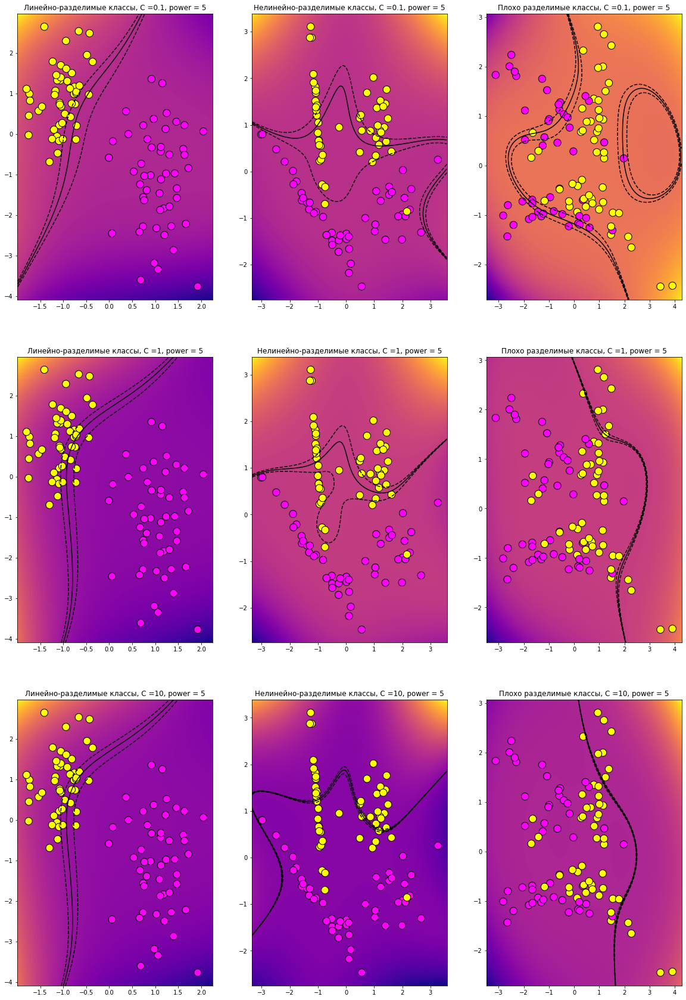

In [30]:
C = [0.1, 1, 10]
fig, ax = plt.subplots(len(C), 3, figsize=(20,30))

state = [8, 13, 57]
classs = [1, 2, 2]
name = ['Линейно-разделимые классы', 'Нелинейно-разделимые классы', 'Плохо разделимые классы' ]
for j in range(3):
    X, y = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=classs[j], random_state=state[j])
    y[y == 0] = -1
    for i in range(len(C)):
        visualize_polynom(X, y, Polynom, i, j, C[i], 5)
        ax[i][j].set_title(name[j] + ', C =' + str(C[i]) + ', power = 5')

Ширина полосы зависит от величены С. Чем выше степень полинома, тем лучше строятся границы классов.

### SVM с RBF-ядром

In [35]:
def visualize_rbf(X, y, kernel, i, j, C, gamma):
   
    RBF = lambda x1, x2 : np.exp(-1 / (2 * gamma) * np.linalg.norm(x1 - x2) ** 2)
    model = DualSVM(C = C, kernel = RBF)
    model.fit(X, y)
    X_supp = model.supp_vect
    y_supp = model.supp_vect_c
    alpha = model.alpha
    bias = model.bias

    ax[i][j].scatter(X[:, 0], X[:, 1], c=y, cmap='cool', edgecolor='black')
    x_lim = np.array(ax[i][j].get_ylim())
    ax[i][j].set_ylim(x_lim[0], x_lim[1])
    ax[i][j].scatter(X_supp[:, 0], X_supp[:, 1], s=150, c = y_supp, cmap='spring', edgecolor='black')
    
    x0_vals = np.linspace(ax[i][j].get_xlim()[0], ax[i][j].get_xlim()[1], 200)
    x1_vals = np.linspace(ax[i][j].get_ylim()[0], ax[i][j].get_ylim()[1], 200)
    xx, yy = np.meshgrid(x0_vals, x1_vals)
    zz = np.reshape(model.predict_proba(np.c_[xx.ravel(), yy.ravel()]), xx.shape)

    ax[i][j].contour(xx, yy, zz, levels=[-1, 0, 1], colors='k', linestyles = ['dashed', 'solid', 'dashed'], linewidths=1.5, zorder=1)
    ax[i][j].pcolormesh(xx, yy, zz, cmap='plasma', zorder=0, shading='nearest')

Гамма 1

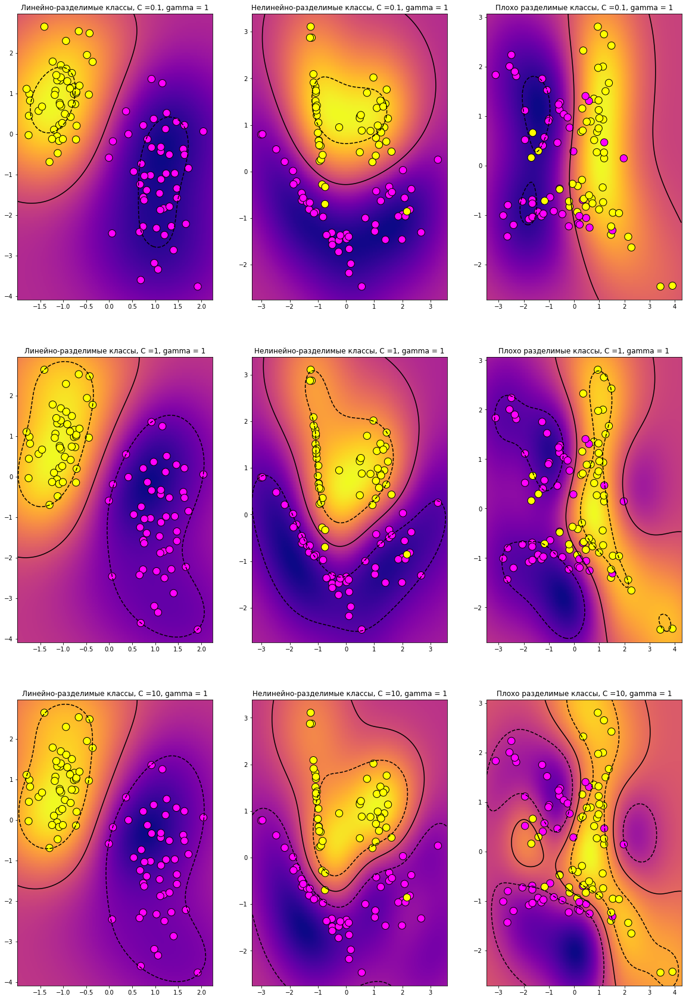

In [37]:
C = [0.1, 1, 10]
fig, ax = plt.subplots(len(C), 3, figsize=(20,30))

state = [8, 13, 57]
classs = [1, 2, 2]
name = ['Линейно-разделимые классы', 'Нелинейно-разделимые классы', 'Плохо разделимые классы' ]
for j in range(3):
    X, y = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=classs[j], random_state=state[j])
    y[y == 0] = -1
    for i in range(len(C)):
        visualize_rbf(X, y, RBF, i, j, C[i], 1)
        ax[i][j].set_title(name[j] + ', C =' + str(C[i]) + ', gamma = 1')

Гамма 2

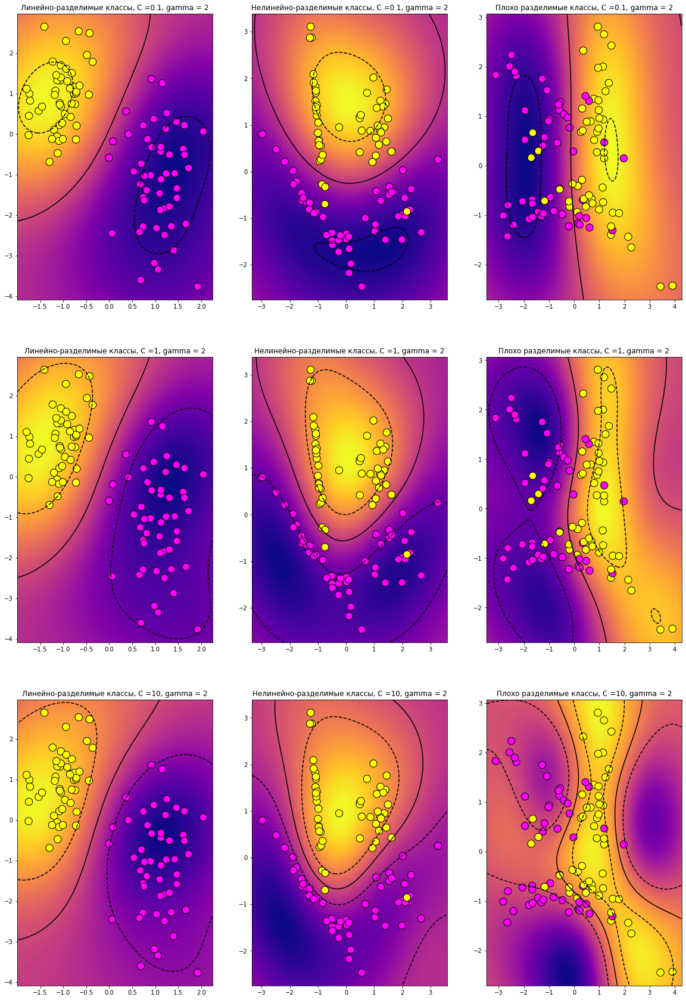

In [38]:
C = [0.1, 1, 10]
fig, ax = plt.subplots(len(C), 3, figsize=(20,30))

state = [8, 13, 57]
classs = [1, 2, 2]
name = ['Линейно-разделимые классы', 'Нелинейно-разделимые классы', 'Плохо разделимые классы' ]
for j in range(3):
    X, y = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=classs[j], random_state=state[j])
    y[y == 0] = -1
    for i in range(len(C)):
        visualize_rbf(X, y, RBF, i, j, C[i], 2)
        ax[i][j].set_title(name[j] + ', C =' + str(C[i]) + ', gamma = 2')

Гамма 5

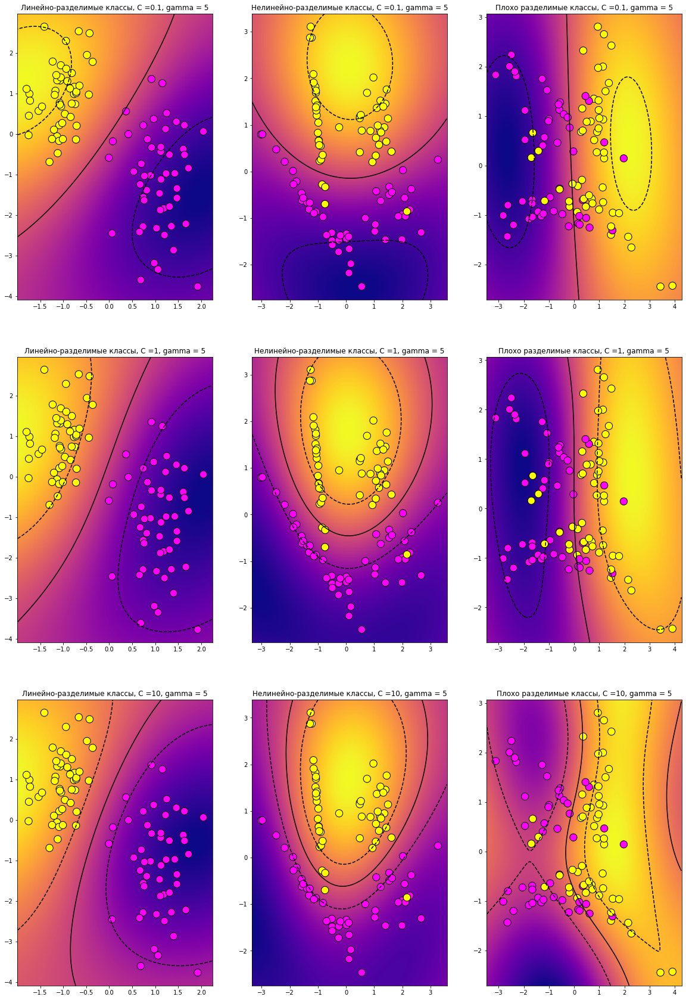

In [39]:
C = [0.1, 1, 10]
fig, ax = plt.subplots(len(C), 3, figsize=(20,30))

state = [8, 13, 57]
classs = [1, 2, 2]
name = ['Линейно-разделимые классы', 'Нелинейно-разделимые классы', 'Плохо разделимые классы' ]
for j in range(3):
    X, y = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=classs[j], random_state=state[j])
    y[y == 0] = -1
    for i in range(len(C)):
        visualize_rbf(X, y, RBF, i, j, C[i], 5)
        ax[i][j].set_title(name[j] + ', C =' + str(C[i]) + ', gamma = 5')

Гамма 10

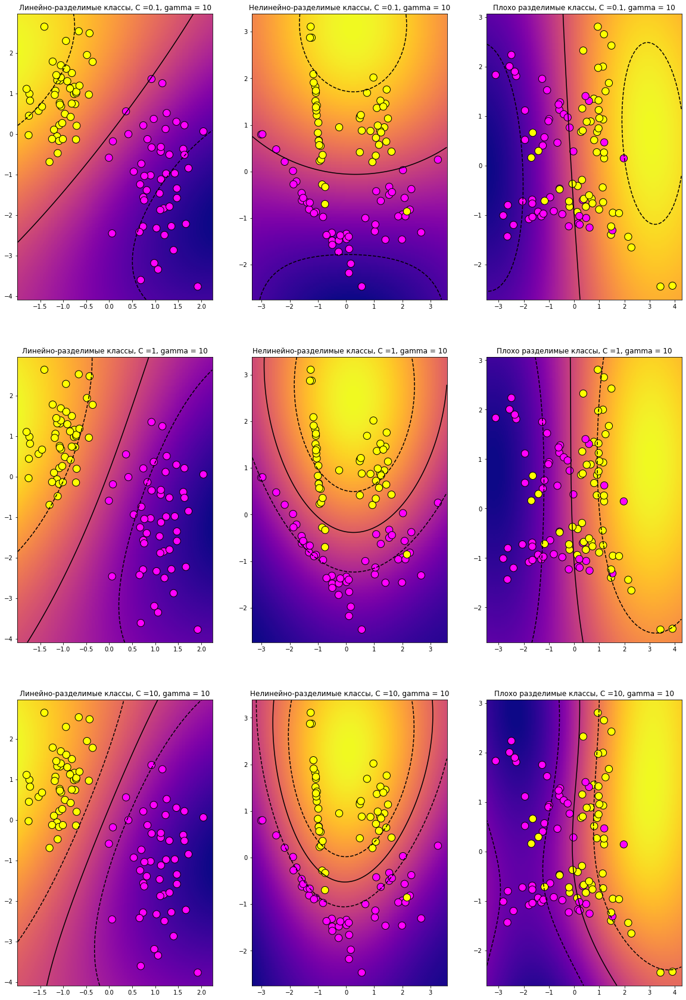

In [40]:
C = [0.1, 1, 10]
fig, ax = plt.subplots(len(C), 3, figsize=(20,30))

state = [8, 13, 57]
classs = [1, 2, 2]
name = ['Линейно-разделимые классы', 'Нелинейно-разделимые классы', 'Плохо разделимые классы' ]
for j in range(3):
    X, y = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=classs[j], random_state=state[j])
    y[y == 0] = -1
    for i in range(len(C)):
        visualize_rbf(X, y, RBF, i, j, C[i], 10)
        ax[i][j].set_title(name[j] + ', C =' + str(C[i]) + ', gamma = 10')

При меньшем значении гамма и большем значении С, переобучение модели сильнее. И чем меньше значение С и больше значение гамма, тем модель грубее.